# Projeto Airbnb Rio - Ferramenta de Previsão de Preço de Imóvel para pessoas comuns 

In [2]:
#continuar

In [3]:
import pandas as pd

#percorrer as pastas
import pathlib

#o caminho é colocado dentro da chave Path, comando abaixo
caminho_bases = pathlib.Path('datasetAirbnb')



colunas= ['host_is_superhost',    
'host_listings_count',     
'latitude',
'longitude' ,
'property_type',        
'room_type',
'accommodates',
'bathrooms',    
'bedrooms',
'beds',
'bed_type',
'amenities',
'price',
'guests_included',
'extra_people',
'minimum_nights',
'maximum_nights',
'number_of_reviews',
'instant_bookable',
'is_business_travel_ready',
'cancellation_policy',
 'last_scraped',         
#'ano',
#'mes',
]

base_airbnb= pd.DataFrame()
#iterar os arquivos
for arquivo in caminho_bases.iterdir(): 
    print(arquivo.name)

    #comecando aqui, colocar o tipo, para pesar menos na memoria o dataframe
    dtype2 ={'host_listings_count':'category',            
      'host_is_superhost':'category',
      'latitude':'float64',
      'longitude':'float64',
      'property_type': 'object',
      'room_type': 'object',
      'accommodates':'int64',
      'bathrooms':'float64',
      'bedrooms':'float64',
      'beds':'float64',
      'bed_type': 'object',
      'amenities': 'object',
      'price': 'object',
      'guests_included':'int64',
      'extra_people': 'object',
      'minimum_nights':'int64',
      'maximum_nights':'int64',
      'number_of_reviews':'int64',
      'instant_bookable': 'object',
      'is_business_travel_ready': 'object',
      'cancellation_policy': 'object',
      'last_scraped': 'object',           
            }
    usecols = list(dtype2.keys())     
    #adicionar o dataframe,, muita memoria
   # for chunk in pd.read_csv(caminho_bases / arquivo.name, encoding='ISO-8859-1',chunksize=10000) :
    for chunk in pd.read_csv(caminho_bases / arquivo.name,chunksize=10000,usecols=usecols, dtype= dtype2) :
   # base_airbnb = base_airbnb.append(df)
    # Append the DataFrame to base_airbnb, muita memoria
        chunk_selecionado= chunk[colunas]
        base_airbnb = pd.concat([base_airbnb, chunk_selecionado], ignore_index=True)




abril2019.csv
agosto2019.csv
setembro2019.csv
maro2019.csv
outubro2018.csv
junho2019.csv
setembro2018.csv
novrmbro2018.csv
agosto2018.csv
novembro2019.csv
fevereiro2020.csv
janeiro2020.csv
julho2019.csv
maio2019.csv
maro2020.csv
fevereiro2019.csv
abril2020.csv
dezembro2019.csv
maio2018.csv
dezembro2018.csv
julho2018.csv
janeiro2019.csv
maio2020.csv
outubro2019.csv
abril2018.csv


In [4]:
base_airbnb= base_airbnb[['last_scraped',
                   'host_listings_count',       
'host_is_superhost',
 'latitude',
 'longitude',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'bed_type',
 'amenities',
 'price',
 'extra_people',
 'minimum_nights',
 'instant_bookable',
 'cancellation_policy',
 ]]

In [5]:
from datetime import datetime

base_airbnb['last_scraped'] = pd.to_datetime(base_airbnb['last_scraped'], format= '%Y-%m-%d')
base_airbnb['ano']= base_airbnb['last_scraped'].dt.year
base_airbnb['mes']= base_airbnb['last_scraped'].dt.month

In [6]:
list(base_airbnb.columns)

['last_scraped',
 'host_listings_count',
 'host_is_superhost',
 'latitude',
 'longitude',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'bed_type',
 'amenities',
 'price',
 'extra_people',
 'minimum_nights',
 'instant_bookable',
 'cancellation_policy',
 'ano',
 'mes']

In [7]:
base_airbnb= base_airbnb.drop(columns=['last_scraped'])

# Tratar valores

In [8]:
for coluna in base_airbnb:
    print(coluna)
    #print(base_airbnb[coluna].isnull().sum())

    
    if base_airbnb[coluna].isnull().sum() > 300000:
        print(base_airbnb[coluna].isnull().sum())
        base_airbnb= base_airbnb.drop(coluna, axis=1)
#linhas e colunas
print(base_airbnb.shape)

host_listings_count
host_is_superhost
latitude
longitude
property_type
room_type
accommodates
bathrooms
bedrooms
beds
bed_type
amenities
price
extra_people
minimum_nights
instant_bookable
cancellation_policy
ano
mes
(902210, 19)


Colunas de mais de 300000 já tinham sido eliminados. Porém, para as colunas, como temos muitos dados ainda (mais de 900.000 linhas),vamos excluir as linhas que contém os dados NaN (nulos).

In [9]:
base_airbnb = base_airbnb.dropna()
print(base_airbnb.shape)

(897709, 19)


In [10]:
base_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 897709 entries, 0 to 902209
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   host_listings_count  897709 non-null  object  
 1   host_is_superhost    897709 non-null  category
 2   latitude             897709 non-null  float64 
 3   longitude            897709 non-null  float64 
 4   property_type        897709 non-null  object  
 5   room_type            897709 non-null  object  
 6   accommodates         897709 non-null  int64   
 7   bathrooms            897709 non-null  float64 
 8   bedrooms             897709 non-null  float64 
 9   beds                 897709 non-null  float64 
 10  bed_type             897709 non-null  object  
 11  amenities            897709 non-null  object  
 12  price                897709 non-null  object  
 13  extra_people         897709 non-null  object  
 14  minimum_nights       897709 non-null  int64   
 15  insta

In [11]:
print('somando quantidade de valores nulos')
print(base_airbnb.isnull().sum())

somando quantidade de valores nulos
host_listings_count    0
host_is_superhost      0
latitude               0
longitude              0
property_type          0
room_type              0
accommodates           0
bathrooms              0
bedrooms               0
beds                   0
bed_type               0
amenities              0
price                  0
extra_people           0
minimum_nights         0
instant_bookable       0
cancellation_policy    0
ano                    0
mes                    0
dtype: int64


In [12]:
import numpy as np
base_airbnb['price'] =  base_airbnb['price'].str.replace('$', '')
base_airbnb['price'] =  base_airbnb['price'].str.replace(',', '')
#float32 - > para ocupar menos espaço
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False)

base_airbnb['extra_people'] =  base_airbnb['extra_people'].str.replace('$', '')
base_airbnb['extra_people'] =  base_airbnb['extra_people'].str.replace(',', '')
#float32 - > para ocupar menos espaço
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False)

In [13]:
base_airbnb['host_is_superhost']= base_airbnb['host_is_superhost'].astype('object')

In [14]:
base_airbnb['host_listings_count']= base_airbnb['host_listings_count'].astype('int32')

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [16]:

#def limites(base_airbnb_2['price']):
def limites(coluna):

    q1 = coluna.quantile(0.25)
    q3 = coluna.quantile(0.75)
    amplitude = q3 -q1
    limite_inferior= q1 -1.5*amplitude
    limite_superior= q3 +1.5*amplitude
    return limite_inferior, limite_superior


#q1 25% e q3 75%
# amplitude q1-q3
#limite inferior q1-1,5*amplitude
#limite superior q3+1,5*amplitude

In [17]:
#saber o limite inferior e o superior
def excluir_outliers(df, nome_coluna):
      qtde_linhas = df.shape[0]
      lim_inf, lim_sup = limites(df[nome_coluna])
      #df= df.loc[linha, coluna]
      #df= df.loc[linhas, :]
      df= df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :]
      linhas_removidas =  qtde_linhas  - df.shape[0]
      return df, linhas_removidas

In [18]:
#tirar os dados nulos
base_airbnb = base_airbnb.dropna()
print(base_airbnb.shape)

(897709, 19)


In [19]:
print("(linha, coluna)")
print(base_airbnb.shape)
print("linha")
base_airbnb.shape[0]

(linha, coluna)
(897709, 19)
linha


897709

In [20]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'price')
print('{} linhas removidas'.format(linhas_removidas))

87282 linhas removidas


In [21]:
print("(linha, coluna)")
print(base_airbnb.shape)

(linha, coluna)
(810427, 19)


In [22]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'extra_people')
print('{} linhas removidas'.format(linhas_removidas))

59194 linhas removidas


In [23]:
print(base_airbnb.shape)

(751233, 19)


In [24]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

97723 linhas removidas


In [25]:
# peneirar pelo accomodates

base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

13146 linhas removidas


In [26]:
# peneirar pelo bathrooms

base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

6894 linhas removidas


In [27]:
#remover o outliers
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

5482 linhas removidas


In [28]:
#remover o outliers
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'beds')
print('{} linhas removidas'.format(linhas_removidas))

5622 linhas removidas


In [29]:
#tirar outliers acima de 8
#remover o outliers
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

40383 linhas removidas


In [30]:
base_airbnb.shape

(581983, 19)

In [31]:
list(base_airbnb.columns)

['host_listings_count',
 'host_is_superhost',
 'latitude',
 'longitude',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'bed_type',
 'amenities',
 'price',
 'extra_people',
 'minimum_nights',
 'instant_bookable',
 'cancellation_policy',
 'ano',
 'mes']

# tratamento de colunas de Valores de Texto
* property_type

In [32]:
print(base_airbnb['property_type'].value_counts())

property_type
Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                     

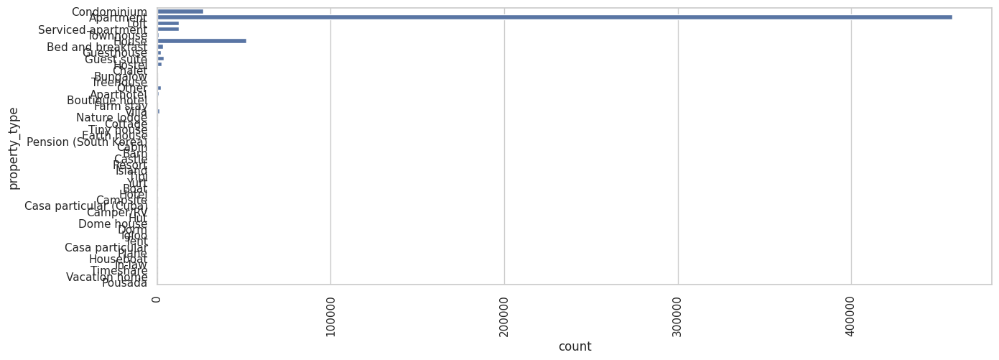

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')
#contar
grafico= sns.countplot(base_airbnb['property_type'])
grafico.tick_params(axis='x', rotation=90)


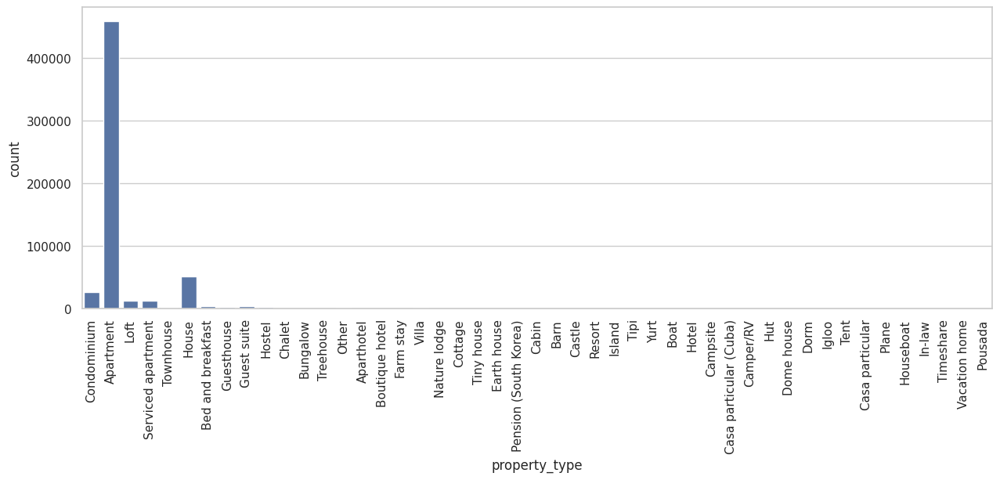

In [34]:
#https://seaborn.pydata.org/generated/seaborn.countplot.html
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')
#contar
grafico= sns.countplot(base_airbnb, x="property_type")

grafico.tick_params(axis='x', rotation=90)

In [35]:
#tabela com os valores
tabela_tipos_casa = base_airbnb['property_type'].value_counts()
#lista de tipos de casa por escrito
print(tabela_tipos_casa.index)
print(tabela_tipos_casa['Loft'])
#percorrer tabela tipos de casa, um tipo menor que 2000, casa que vou agrupar referesse a valores acima.
colunas_agrupar=[]
for tipo in tabela_tipos_casa.index:
     if tabela_tipos_casa[tipo] < 2000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

Index(['Apartment', 'House', 'Condominium', 'Serviced apartment', 'Loft',
       'Guest suite', 'Bed and breakfast', 'Hostel', 'Guesthouse', 'Other',
       'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house',
       'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)',
       'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle',
       'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV',
       'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pension (South Korea)',
       'Dome house', 'Igloo', 'In-law', 'Vacation home', 'Houseboat',
       'Timeshare', 'Pousada', 'Casa particular', 'Plane'],
      dtype='object', name='property_type')
12352
['Other', 'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house', 'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)', 'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle', 'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV', 'Yurt', 'Tent', 'Tipi

In [36]:

for tipo in colunas_agrupar:
    #base_airbnb.loc[linha, coluna]
    base_airbnb.loc[base_airbnb['property_type']==tipo,'property_type'] = 'Outros'

print(base_airbnb['property_type'].value_counts())

property_type
Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Outros                  8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: count, dtype: int64


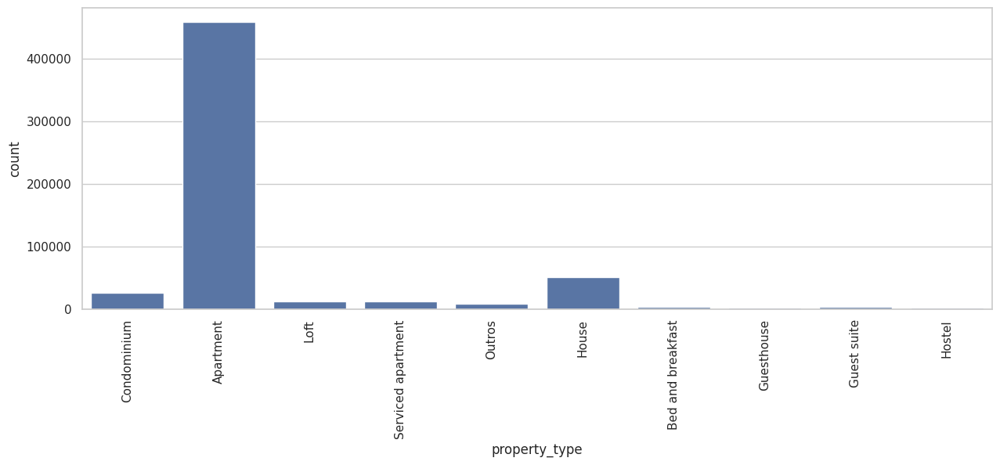

In [37]:
#https://seaborn.pydata.org/generated/seaborn.countplot.html
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')
#contar
grafico= sns.countplot(base_airbnb, x="property_type")

grafico.tick_params(axis='x', rotation=90)

/tmp/ipykernel_3460/1979615355.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  grafico= sns.countplot(base_airbnb, x="property_type",palette='viridis')


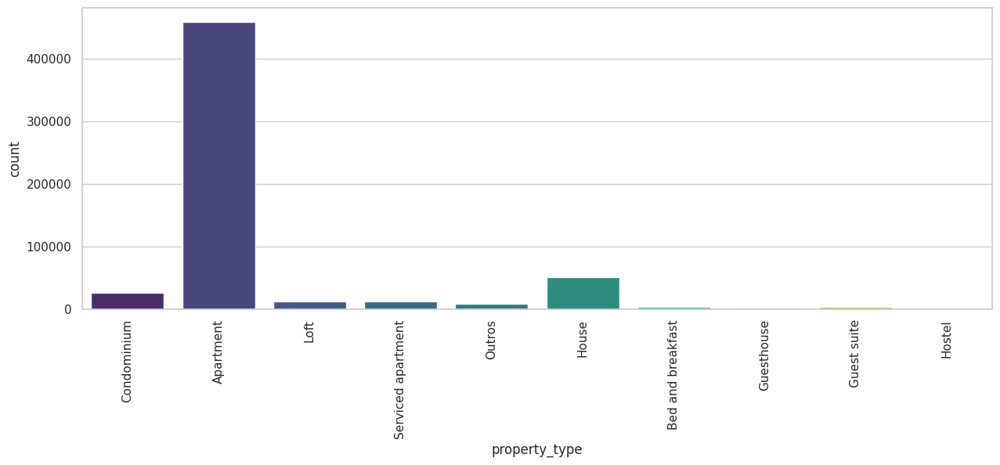

In [38]:

#https://seaborn.pydata.org/generated/seaborn.countplot.html
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')
#contar
grafico= sns.countplot(base_airbnb, x="property_type",palette='viridis')

grafico.tick_params(axis='x', rotation=90)

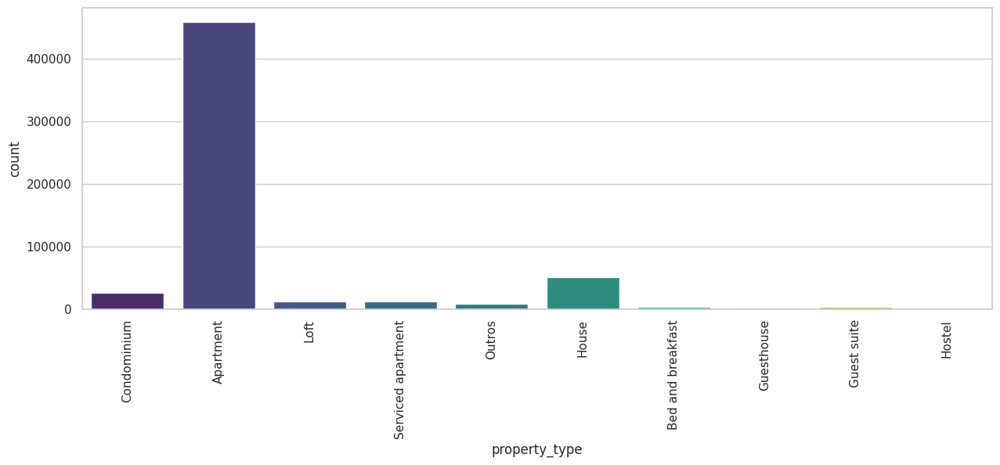

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("viridis", n_colors=len(set(base_airbnb["property_type"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="property_type", hue="property_type", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)
plt.show()

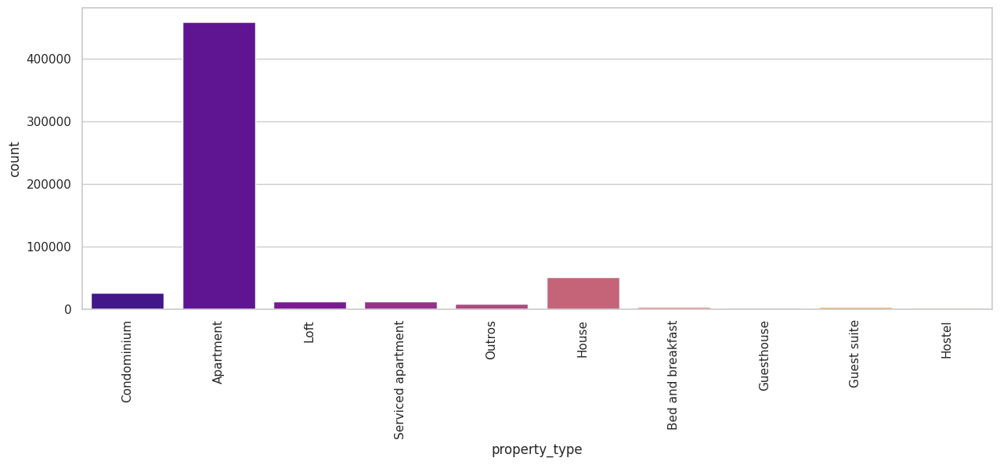

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("plasma", n_colors=len(set(base_airbnb["property_type"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="property_type", hue="property_type", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)

* room_type está ok


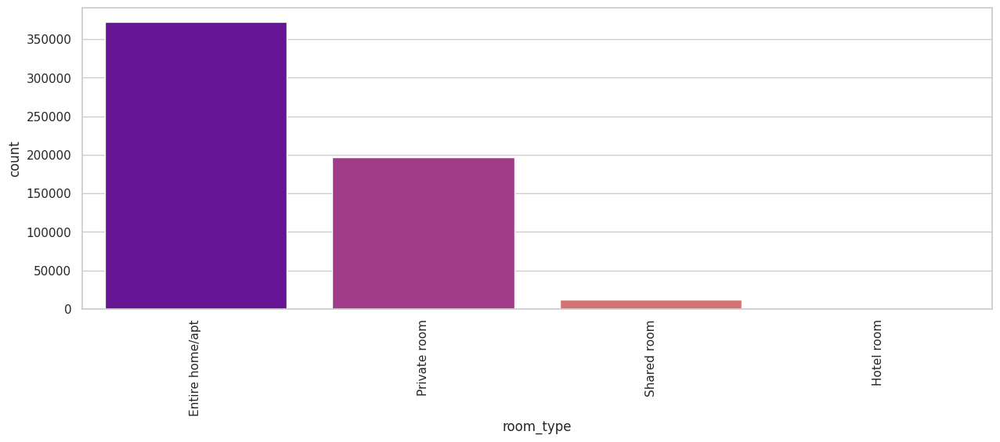

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("plasma", n_colors=len(set(base_airbnb["room_type"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="room_type", hue="room_type", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)

In [42]:
base_airbnb['room_type'].value_counts()


room_type
Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: count, dtype: int64

* bed_type

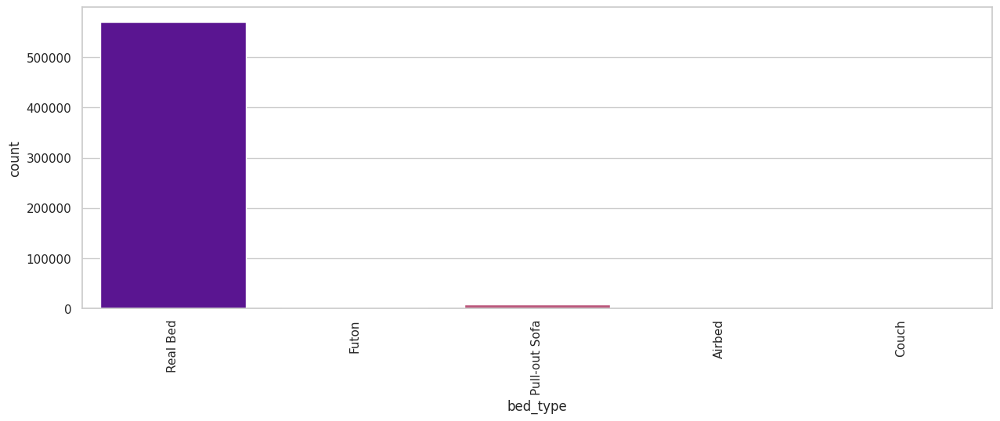

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("plasma", n_colors=len(set(base_airbnb["bed_type"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="bed_type", hue="bed_type", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)

In [44]:
print(base_airbnb['bed_type'].value_counts())


bed_type
Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: count, dtype: int64


In [45]:
#pode colocar como duas categorias só, podemos testar depois

In [46]:
#tabela com os valores
tabela_tipos_cama= base_airbnb['bed_type'].value_counts()
#lista de tipos de casa por escrito
print(tabela_tipos_cama.index)
#percorrer tabela tipos de casa, um tipo menor que 2000, casa que vou agrupar referesse a valores acima.
colunas_agrupar_2=[]
for tipo in tabela_tipos_cama.index:
     if tabela_tipos_cama[tipo] < 9000:
        colunas_agrupar_2.append(tipo)
print(colunas_agrupar_2)

Index(['Real Bed', 'Pull-out Sofa', 'Futon', 'Airbed', 'Couch'], dtype='object', name='bed_type')
['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']


In [47]:
for tipo in colunas_agrupar_2:
    #base_airbnb.loc[linha, coluna]
    base_airbnb.loc[base_airbnb['bed_type']==tipo,'bed_type'] = 'Outros tipos de Cama'

print(base_airbnb['bed_type'].value_counts())

bed_type
Real Bed                570643
Outros tipos de Cama     11340
Name: count, dtype: int64


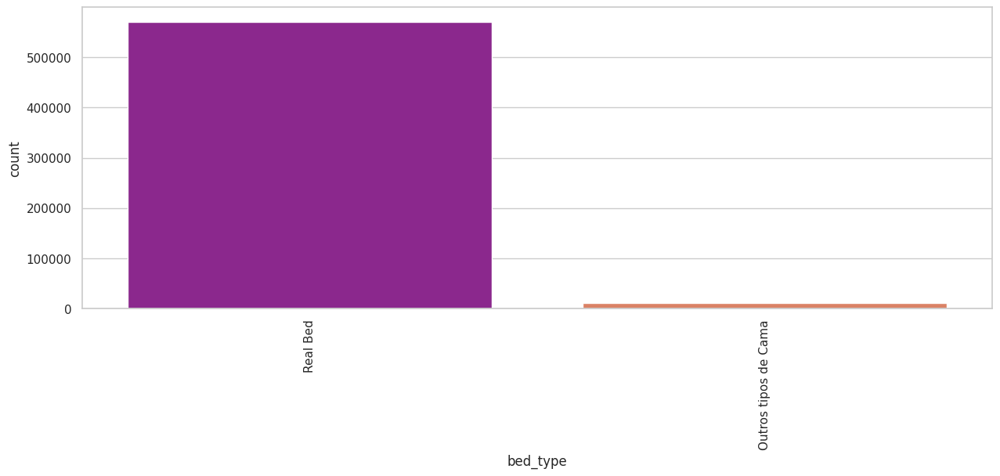

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("plasma", n_colors=len(set(base_airbnb["bed_type"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="bed_type", hue="bed_type", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)

* cancellation_policy



cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: count, dtype: int64


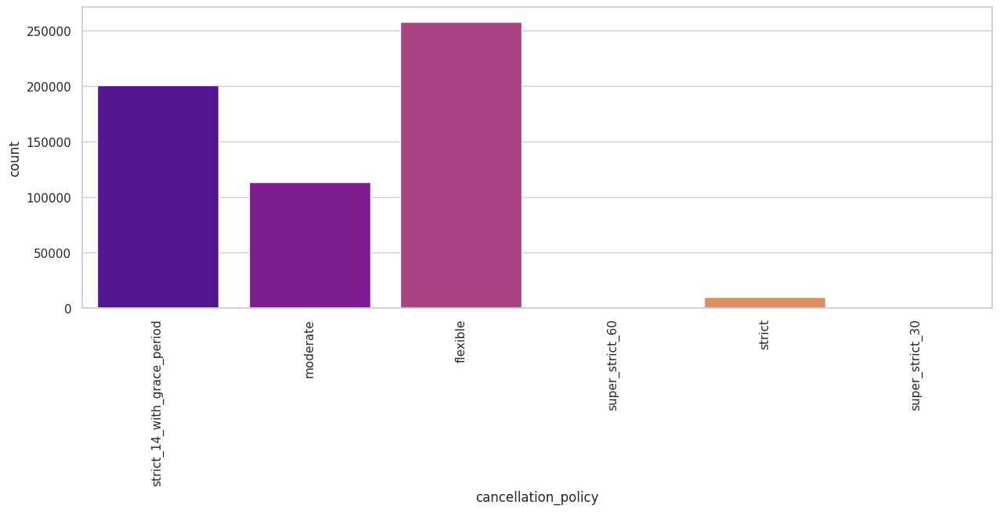

In [49]:
print(base_airbnb['cancellation_policy'].value_counts())

import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("plasma", n_colors=len(set(base_airbnb["cancellation_policy"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="cancellation_policy", hue="cancellation_policy", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)

In [50]:
# strict agora

# agrupando categorias de cancellation_pollicy
#tabela com os valores
tabela_tipos_cama= base_airbnb['cancellation_policy'].value_counts()
#lista de tipos de casa por escrito
print(tabela_tipos_cama.index)
#percorrer tabela tipos de casa, um tipo menor que 2000, casa que vou agrupar referesse a valores acima.
colunas_agrupar_3=[]
for tipo in tabela_tipos_cama.index:
     if tabela_tipos_cama[tipo] < 10000:
        colunas_agrupar_3.append(tipo)
print(colunas_agrupar_2)


for tipo in colunas_agrupar_3:
    #base_airbnb.loc[linha, coluna]
    base_airbnb.loc[base_airbnb['cancellation_policy']==tipo,'cancellation_policy'] = 'strict'

print(base_airbnb['cancellation_policy'].value_counts())

Index(['flexible', 'strict_14_with_grace_period', 'moderate', 'strict',
       'super_strict_60', 'super_strict_30'],
      dtype='object', name='cancellation_policy')
['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']
cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: count, dtype: int64


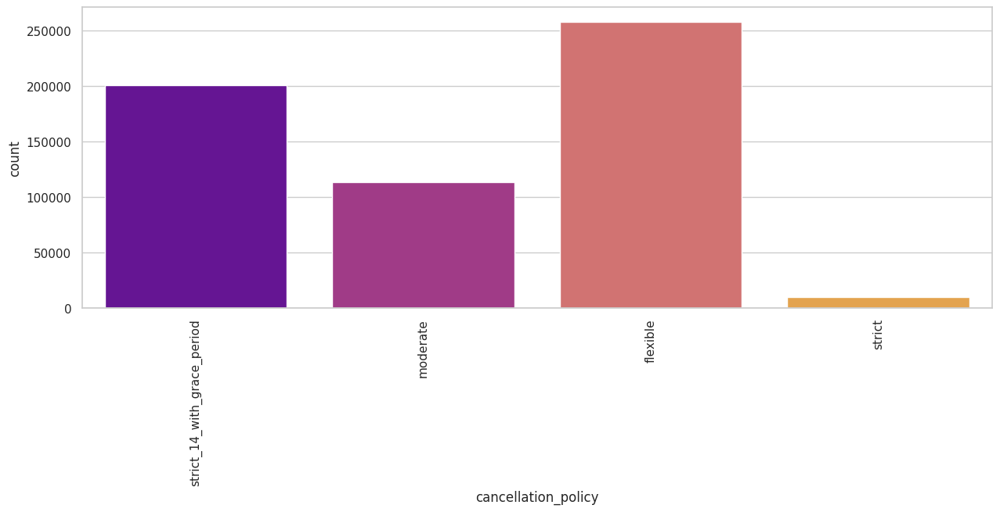

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
sns.set_theme(style='whitegrid')

# Use Seaborn's color palette generator
palette = sns.color_palette("plasma", n_colors=len(set(base_airbnb["cancellation_policy"])))

# Create the count plot with the hue parameter
grafico = sns.countplot(data=base_airbnb, x="cancellation_policy", hue="cancellation_policy", palette=palette, legend=False)

grafico.tick_params(axis='x', rotation=90)

# amenities

In [52]:
print(base_airbnb['amenities'].iloc[0])

{TV,"Cable TV",Internet,Wifi,"Air conditioning",Kitchen,"Paid parking off premises","Smoking allowed",Doorman,Elevator,"Hot tub","Family/kid friendly","Suitable for events",Essentials,"24-hour check-in",Hangers,"Hair dryer",Iron,"Laptop friendly workspace","Self check-in","Building staff","Private entrance","Hot water","Bed linens","Luggage dropoff allowed"}


In [53]:
print(base_airbnb['amenities'].iloc[1])

{TV,"Cable TV",Internet,Wifi,"Air conditioning",Kitchen,Doorman,Elevator,"Buzzer/wireless intercom","Family/kid friendly",Hangers,"Hair dryer",Iron,"Laptop friendly workspace"}


In [54]:
print(base_airbnb['amenities'])

0         {TV,"Cable TV",Internet,Wifi,"Air conditioning...
1         {TV,"Cable TV",Internet,Wifi,"Air conditioning...
2         {TV,"Cable TV",Internet,Wifi,"Air conditioning...
3         {TV,"Cable TV",Internet,Wifi,"Air conditioning...
4         {TV,"Cable TV",Wifi,"Air conditioning",Kitchen...
                                ...                        
902205    {TV,"Cable TV",Wifi,Kitchen,"Smoking allowed",...
902206    {TV,Wifi,"Air conditioning","Smoking allowed",...
902207    {TV,Wifi,"Air conditioning",Kitchen,"Smoking a...
902208    {TV,Wifi,"Air conditioning",Pool,Kitchen,"Free...
902209    {TV,"Cable TV",Wifi,"Air conditioning",Kitchen...
Name: amenities, Length: 581983, dtype: object


In [55]:
#quantidades de amenities, que geram comodidades (mais detalhistas)
# cada amenities em uma virgula
print(base_airbnb['amenities'].iloc[0].split(','))
print(f"{len(base_airbnb['amenities'].iloc[0].split(','))} itens")


['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', '"Paid parking off premises"', '"Smoking allowed"', 'Doorman', 'Elevator', '"Hot tub"', '"Family/kid friendly"', '"Suitable for events"', 'Essentials', '"24-hour check-in"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"', '"Self check-in"', '"Building staff"', '"Private entrance"', '"Hot water"', '"Bed linens"', '"Luggage dropoff allowed"}']
25 itens


In [56]:
print(base_airbnb['amenities'].iloc[1].split(','))
print(f"{len(base_airbnb['amenities'].iloc[1].split(','))} itens")

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', 'Doorman', 'Elevator', '"Buzzer/wireless intercom"', '"Family/kid friendly"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"}']
14 itens



Como temos uma diversidade muito grande de amenities e às vezes, as mesmas amenities podem ser escritas de forma diferente, vamos avaliar a quantidade de amenities como o parâmetro para o nosso modelo. 


In [57]:

#aplicar a parte de string, forma de texto, quantidade no dicionário
base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len)

In [58]:
base_airbnb

,host_listings_count,host_is_superhost,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,extra_people,minimum_nights,instant_bookable,cancellation_policy,ano,mes,n_amenities
0,2,f,-22.965920,-43.178960,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",302.0,58.0,5,t,strict_14_with_grace_period,2019,4,25
1,3,f,-22.977120,-43.190450,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",159.0,45.0,4,f,strict_14_with_grace_period,2019,4,14
2,1,t,-22.983020,-43.214270,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",252.0,39.0,2,t,strict_14_with_grace_period,2019,4,17
3,1,t,-22.988160,-43.193590,Apartment,Entire home/apt,3,1.5,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",350.0,58.0,2,f,strict_14_with_grace_period,2019,4,31
4,1,t,-22.981270,-43.190460,Loft,Entire home/apt,2,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Wifi,""Air conditioning"",Kitchen...",221.0,80.0,3,t,strict_14_with_grace_period,2019,4,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,2,f,-22.955330,-43.179623,Apartment,Entire home/apt,2,1.0,0.0,1.0,Real Bed,"{TV,""Cable TV"",Wifi,Kitchen,""Smoking allowed"",...",181.0,0.0,3,t,flexible,2018,4,12
902206,2,f,-22.963347,-43.176138,Apartment,Entire home/apt,2,1.0,1.0,1.0,Real Bed,"{TV,Wifi,""Air conditioning"",""Smoking allowed"",...",130.0,0.0,1,f,flexible,2018,4,9
902207,2,f,-22.966920,-43.177281,Apartment,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Smoking a...",229.0,0.0,1,t,flexible,2018,4,10
902208,1,f,-22.966591,-43.385660,Apartment,Entire home/apt,5,2.0,2.0,2.0,Real Bed,"{TV,Wifi,""Air conditioning"",Pool,Kitchen,""Free...",249.0,0.0,5,t,flexible,2018,4,16


In [ ]:
base_airbnb=base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

In [62]:
#histograma  de gráfico de barras
def grafico_barra0(coluna):
     plt.figure(figsize=(15,5))
     #y value_counts() #quantidade de pessoas com determinada quantidade de imoveis
    #indice= (quantidade de imoveis
     ax= sns.barplot(x= coluna.value_counts().index, y=coluna.value_counts(), color='orange')
     ax.set_xlim(limites(coluna))
    #ax.set_xlim(limite_inferior, limite_superior + algumvalor)
    #aumentar o eixo 

def diagrama_caixa2(coluna):
    fig, (ax1, ax2) = plt.subplots(1,2)
    
    #outra forma do tamanho de um lado para outro
    fig.set_size_inches(15,5)
    
    sns.boxplot(x=coluna, ax= ax1)
    #eixo ax 
    
    
    #setar o limite do eixo x
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax= ax2)


def histogramaC(coluna):
    plt.figure(figsize=(15,5))
    sns.histplot(coluna, kde= True, stat='density')



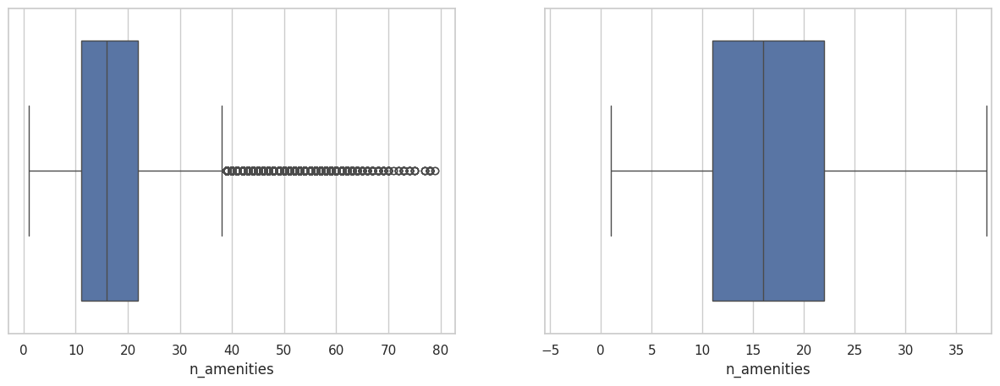

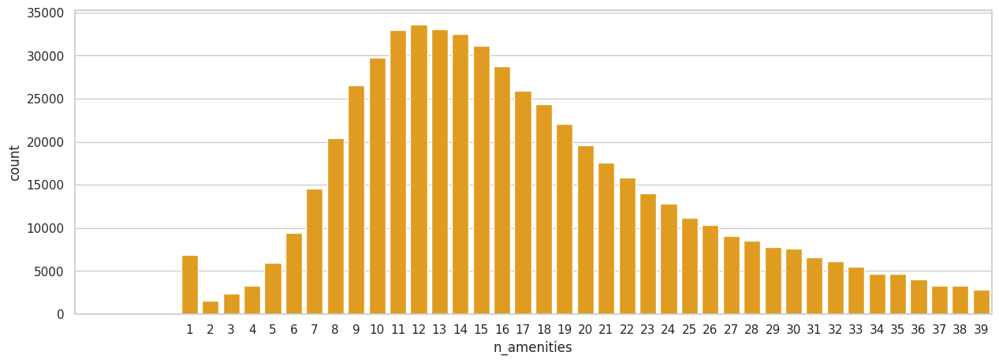

In [63]:
diagrama_caixa2(base_airbnb['n_amenities'])
#sns.barplot(x=base_airbnb['beds'].value_counts().index , y=base_airbnb['beds'].value_counts(), color = 'darkblue')
grafico_barra0(base_airbnb['n_amenities'])

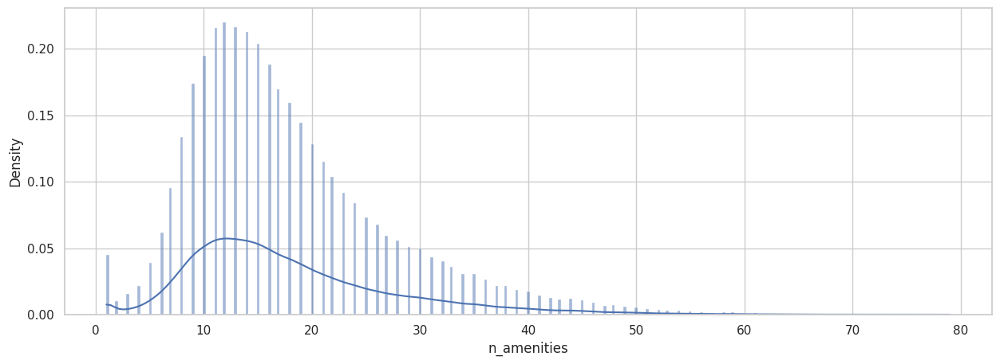

In [64]:


histogramaC(base_airbnb['n_amenities'])

In [65]:
def histogramaD(base, coluna):
    plt.figure(figsize=(15,5))
    sns.histplot(data=base, x= coluna, element='bars', kde= True, binwidth=2, stat='density')




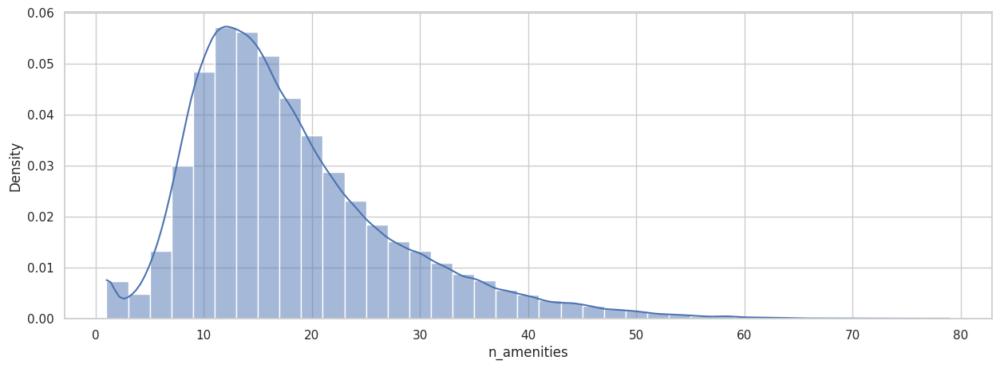

In [66]:
histogramaD(base_airbnb,'n_amenities')

# retirar os outliers

In [67]:
#tratamento de dados numericos


base_airbnb, linhas_removidas= excluir_outliers(base_airbnb, 'n_amenities')
print('{} linhas_removidas'.format(linhas_removidas))

24343 linhas_removidas



### Visualização de Mapa das Propriedades
# matplotlib 

plotly.express.density_mapbox


 https://github.com/plotly/plotly.py?tab=readme-ov-file

 https://plotly.com/python/

 https://plotly.com/python-api-reference/generated/plotly.express.density_mapbox
 
 https://www.kaggle.com/code/allanbruno/helping-regular-people-price-listings-on-airbnb
 EDA and regression - Rio de Janeiro AirBnb daa kaggle.co

In [68]:
print(base_airbnb['latitude'])
print(base_airbnb.latitude)
print(base_airbnb['longitude'])
base_airbnb.longitude

0        -22.965920
1        -22.977120
2        -22.983020
3        -22.988160
4        -22.981270
            ...    
902205   -22.955330
902206   -22.963347
902207   -22.966920
902208   -22.966591
902209   -22.976557
Name: latitude, Length: 557640, dtype: float64
0        -22.965920
1        -22.977120
2        -22.983020
3        -22.988160
4        -22.981270
            ...    
902205   -22.955330
902206   -22.963347
902207   -22.966920
902208   -22.966591
902209   -22.976557
Name: latitude, Length: 557640, dtype: float64
0        -43.178960
1        -43.190450
2        -43.214270
3        -43.193590
4        -43.190460
            ...    
902205   -43.179623
902206   -43.176138
902207   -43.177281
902208   -43.385660
902209   -43.189394
Name: longitude, Length: 557640, dtype: float64


0        -43.178960
1        -43.190450
2        -43.214270
3        -43.193590
4        -43.190460
            ...    
902205   -43.179623
902206   -43.176138
902207   -43.177281
902208   -43.385660
902209   -43.189394
Name: longitude, Length: 557640, dtype: float64

In [69]:
base_airbnb['price']

0         302.0
1         159.0
2         252.0
3         350.0
4         221.0
          ...  
902205    181.0
902206    130.0
902207    229.0
902208    249.0
902209    120.0
Name: price, Length: 557640, dtype: float32

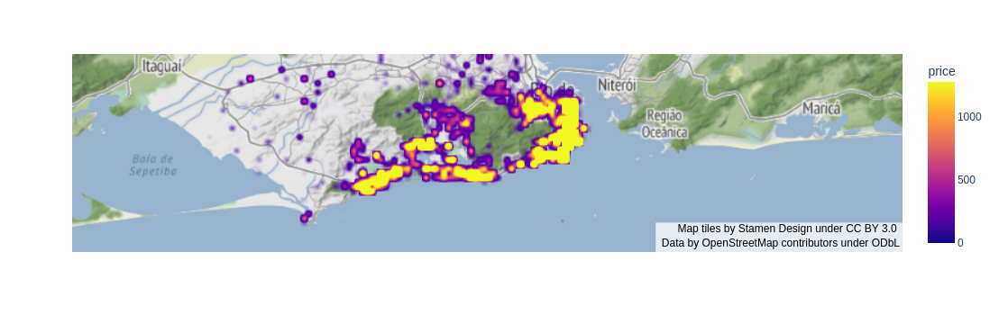

In [70]:
import plotly.express as px
import plotly.io as pio

# Your Mapbox access token
mapbox_access_token = 'your-access-token'

# Sample data
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}

# Create the density mapbox plot
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude', z='price',
                         radius=2.5,
                         center=centro_mapa, zoom=10,
                         mapbox_style='stamen-terrain')

# Add the Mapbox access token
mapa.update_layout(mapbox_accesstoken=mapbox_access_token)

# Save the plot as an HTML file
pio.write_html(mapa, file='mapa2.html', auto_open=True)

# Optionally, you can also show the plot in your notebook or environment
mapa.show()

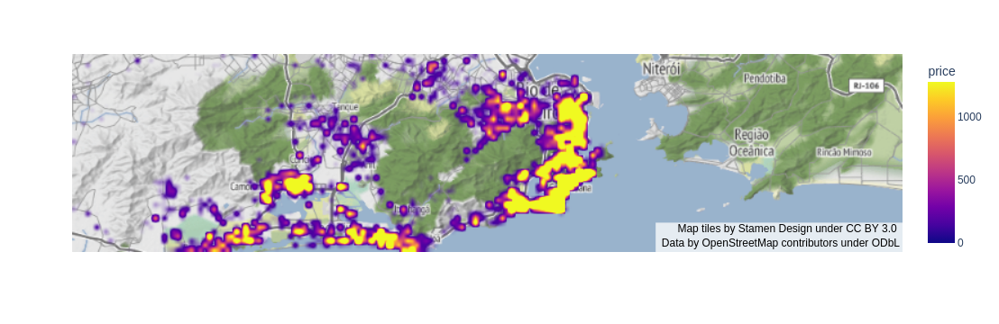

In [71]:
import plotly.express as px

# Your Mapbox access token
mapbox_access_token = 'your-access-token'

# Sample data
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}

# Create the density mapbox plot
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude', z='price',
                         radius=2.5,
                         center=centro_mapa, zoom=10,
                         mapbox_style='stamen-terrain')

# Add the Mapbox access token
mapa.update_layout(mapbox_accesstoken=mapbox_access_token)

# Show the plot
mapa.show()

In [72]:
import plotly.express as px
import plotly.io as pio

#    Ensure you are using a valid Mapbox style such as 'open-street-map', 'carto-positron', 'carto-darkmatter', or 'stamen-terrain'.
# Your Mapbox access token
mapbox_access_token = 'your-access-token'

# Sample data
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}

# Create the density mapbox plot
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude', z='price',
                         radius=2.5,
                         center=centro_mapa, zoom=10,
                         mapbox_style='open-street-map')

# Add the Mapbox access token to the layout
mapa.update_layout(mapbox_accesstoken=mapbox_access_token)

# Save the plot as an HTML file
pio.write_html(mapa, file='mapageral.html', auto_open=True)

# Optionally, you can also show the plot in your notebook or environment
#mapa.show()

In [73]:
import plotly.express as px
import plotly.io as pio

#    Ensure you are using a valid Mapbox style such as 'open-street-map', 'carto-positron', 'carto-darkmatter', or 'stamen-terrain'.
# Your Mapbox access token
mapbox_access_token = 'your-access-token'

# Sample data
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}

# Create the density mapbox plot
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude', z='price',
                         radius=2.5,
                         center=centro_mapa, zoom=10,
                         mapbox_style='carto-positron')

# Add the Mapbox access token to the layout
mapa.update_layout(mapbox_accesstoken=mapbox_access_token)

# Save the plot as an HTML file
pio.write_html(mapa, file='mapageral_definitivo.html', auto_open=True)

# Optionally, you can also show the plot in your notebook or environment
#mapa.show()

In [74]:
import plotly.express as px
import plotly.io as pio

#    Ensure you are using a valid Mapbox style such as 'open-street-map', 'carto-positron', 'carto-darkmatter', or 'stamen-terrain'.
# Your Mapbox access token
mapbox_access_token = 'your-access-token'

# Sample data
amostra = base_airbnb.sample(n=50000)
centro_mapa = {'lat': amostra.latitude.mean(), 'lon': amostra.longitude.mean()}

# Create the density mapbox plot
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude', z='price',
                         radius=2.5,
                         center=centro_mapa, zoom=10,
                         mapbox_style='carto-darkmatter')

# Add the Mapbox access token to the layout
mapa.update_layout(mapbox_accesstoken=mapbox_access_token)

# Save the plot as an HTML file
pio.write_html(mapa, file='mapageral_definitivo_escuro.html', auto_open=True)

# Optionally, you can also show the plot in your notebook or environment
#mapa.show()